<a href="https://colab.research.google.com/github/Batovs/MAP2110-2021-Modelagem-Matematica/blob/main/Projeto%206/Caos.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import copy

# Algoritmo de Arnold

In [ ]:
def arnold(img, it=30):
    n = img.shape[0]
    nova_imagem = np.zeros(img.shape)
    
    fig = plt.figure(figsize=(100, 120))
    plot_rows = 6
    plot_columns = 5
    
    for i in range(it):
        for x in range(n):
            for y in range(n):
                x_novo = (x + y) % n
                y_novo = (x + 2*y) % n
                nova_imagem[x_novo, y_novo] = img[x, y]
        img = copy.deepcopy(nova_imagem)
        
        fig.add_subplot(plot_rows, plot_columns, i+1)
        plt.imshow(nova_imagem)
        plt.axis('off')

# Algoritmo de Arnold com a, b, d, d

In [ ]:
def arnold_abcd(img, key=[[1, 1], [1, 2]], it=150):
    a, b, c, d = key[0][0], key[0][1], key[1][0], key[1][1]
    n = img.shape[0]
    nova_imagem = np.zeros(img.shape)
    
    fig = plt.figure(figsize=(100, 500))
    plot_rows = it/5
    plot_columns = 5
    
    for i in range(it):
        for x in range(n):
            for y in range(n):
                x_novo = (a*x + b*y) % n
                y_novo = (c*x + d*y) % n
                nova_imagem[x_novo, y_novo] = img[x, y]
        img = copy.deepcopy(nova_imagem)
        
        fig.add_subplot(plot_rows, plot_columns, i+1)
        plt.imshow(nova_imagem)
        plt.axis('off')

#Algoritmo de Arnold 2 (por Matriz)

In [ ]:
def arnold(img, matriz_chave=np.array([[1, 1],[1, 2]]), it=30):
  n_pixel = img.shape[0]
  nova_img = np.zeros(img.shape)

  #criacao da figura, subplots com 5 colunas
  fig = plt.figure(figsize=(100, 120))
  plot_columns = 5
  plot_rows = int(it/plot_columns)

  for i in range(it):
    for m in range(n_pixel):
      for n in range(n_pixel):
        pixel = np.array([[m], [n]])
        nova_pos = (matriz_chave @ pixel/n_pixel)%1
        nova_pos *= n_pixel
        novo_m = int((nova_pos[0]).round())
        novo_n = int((nova_pos[1]).round())
        nova_img[novo_m][novo_n] = img[m][n]

    #cada iteracao em um subplot
    fig.add_subplot(plot_rows, plot_columns, i+1)
    plt.imshow(np.rot90(img))
    plt.axis('off')

    #necessario criar um copia para funcionar
    img = np.copy(nova_img)

    #Salvar uma das iteracoes para o outro grupo
    if i == 6:
      img_grupo = np.copy(img)
  return img_grupo

#Imagem para o outro grupo

In [ ]:
matriz_chave = np.array([[1, 6], [2, 13]])
it = 25
imagem_grupo = arnold2(caos_norm, matriz_chave, it)

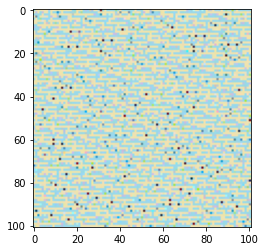

In [ ]:
plt.imshow(imagem_grupo)

In [ ]:
np.savetxt('Imagem_grupo_r.txt',imagem_grupo[:,:,0], delimiter=' ')
np.savetxt('Imagem_grupo_g.txt',imagem_grupo[:,:,1], delimiter=' ')
np.savetxt('Imagem_grupo_b.txt',imagem_grupo[:,:,2], delimiter=' ')

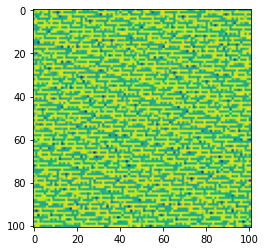

Teste Exemplo1 livro

In [ ]:
#teste Exemplo1 usado a formula (2)
matriz_chave = np.array([[1, 1],[1, 2]])
pixel = np.array([[27.], [58.]])
print(f'pixel inicial\n {pixel}')
for i in range(9):
 pixel = (matriz_chave @ pixel/76)%1
 pixel *= 76
 print(f'iteração {i+1}\n {pixel}')
pixel[0]

# Testando para Nossa Imagem 10x10

In [ ]:
caos_imagem_1 = Image.open('Caos_1.jpeg')
caos_imagem_1 = np.asarray(caos_imagem_1)

In [ ]:
caos_imagem_1[0][0]

array([125, 129, 130], dtype=uint8)

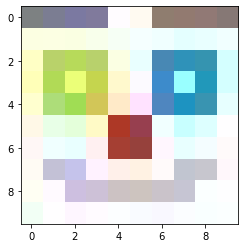

In [ ]:
plt.imshow(caos_imagem_1)

In [ ]:
# Outra forma de normalizar
caos_norm_1 = caos_imagem_1/255
caos_norm_1[0][0]

array([0.49019608, 0.50588235, 0.50980392])

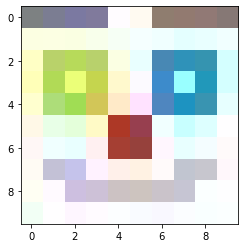

In [ ]:
plt.imshow(caos_norm_1)

In [ ]:
arnold_abcd(caos_norm_1, it=30)

# Testando para nossa imagem 101x101

In [ ]:
caos_imagem = Image.open('Caos.jpeg')
caos_imagem = np.asarray(caos_imagem)

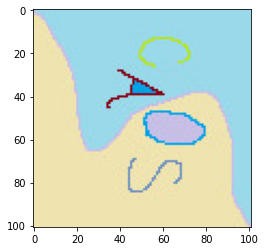

In [ ]:
plt.imshow(np.rot90(caos_imagem, -1))

In [ ]:
caos_norm = caos_imagem/255

In [ ]:
arnold_abcd(caos_norm, it=30)

# Teste Besta 2x2

In [ ]:
teste_besta = np.array([[[0.5,0.25,0.25],[0.25,0.5,0.5]], [[1,0.75,0.75],[0.75,1,1]]])
teste_besta.shape

In [ ]:
plt.imshow(teste_besta)

In [ ]:
arnold(teste_besta, it=3)

# Decodificando a imagem do EX 1

#### Carregando imagem dada

In [ ]:
#arquivos txt no github
url_r = 'https://raw.githubusercontent.com/Batovs/MAP2110---Projeto-6---Caos/main/arnold4_1.txt'
url_g = 'https://raw.githubusercontent.com/Batovs/MAP2110---Projeto-6---Caos/main/arnold4_2.txt'
url_b = 'https://raw.githubusercontent.com/Batovs/MAP2110---Projeto-6---Caos/main/arnold4_3.txt'

In [ ]:
vermelho = np.loadtxt(url_r, delimiter='  ')
verde = np.loadtxt(url_g, delimiter='  ')
azul = np.loadtxt(url_b, delimiter='   ')

In [ ]:
vermelho.shape

(101, 101)

In [ ]:
vermelho_1D = vermelho.flatten()
verde_1D = verde.flatten()
azul_1D = azul.flatten()

In [ ]:
vermelho_1D

array([0.57647059, 0.96862745, 0.92941176, ..., 0.48627451, 0.96078431,
       0.98823529])

In [ ]:
verde_1D

array([0.61568627, 0.98431373, 1.        , ..., 0.32941176, 0.97647059,
       0.99215686])

In [ ]:
azul_1D

array([0.57254902, 0.98823529, 1.        , ..., 0.33333333, 0.98039216,
       1.        ])

In [ ]:
imagem_2D = np.array(list(zip(vermelho_1D, verde_1D, azul_1D)))

In [ ]:
imagem_2D.shape

(10201, 3)

In [ ]:
imagem_3D = imagem_2D.reshape(101, 101, 3)

In [ ]:
imagem_3D

array([[[0.57647059, 0.61568627, 0.57254902],
        [0.96862745, 0.98431373, 0.98823529],
        [0.92941176, 1.        , 1.        ],
        ...,
        [1.        , 0.95686275, 0.95686275],
        [0.96862745, 0.98431373, 0.98823529],
        [0.86666667, 0.75686275, 0.75294118]],

       [[0.95686275, 0.96078431, 0.96862745],
        [0.96862745, 0.98431373, 0.98823529],
        [0.09803922, 0.42352941, 0.8       ],
        ...,
        [0.96470588, 0.98823529, 0.98823529],
        [0.98039216, 0.98431373, 0.99215686],
        [0.96862745, 0.98431373, 0.98823529]],

       [[0.96078431, 0.99215686, 1.        ],
        [0.91764706, 0.96078431, 0.92941176],
        [0.96862745, 0.98823529, 1.        ],
        ...,
        [0.11764706, 0.47058824, 0.85098039],
        [0.83137255, 0.83921569, 0.83529412],
        [0.50588235, 0.41176471, 0.41176471]],

       ...,

       [[0.96862745, 0.98431373, 0.98823529],
        [0.97254902, 0.97647059, 0.98431373],
        [0.96862745, 0

In [ ]:
imagem_3D.shape

(101, 101, 3)

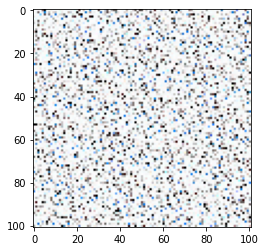

In [ ]:
plt.imshow(np.rot90(imagem_3D))

#### Aplicando Arnold

In [ ]:
arnold_abcd(imagem_3D, it=30)

array([[[0.57647059, 0.61568627, 0.57254902],
        [0.69803922, 0.69803922, 0.69019608],
        [0.96862745, 0.98431373, 0.98823529],
        ...,
        [0.98431373, 1.        , 1.        ],
        [0.96470588, 0.98039216, 0.98431373],
        [0.62352941, 0.49019608, 0.45490196]],

       [[0.99607843, 0.98039216, 0.97647059],
        [0.97254902, 0.98823529, 0.99215686],
        [0.32156863, 0.30196078, 0.28627451],
        ...,
        [0.97254902, 1.        , 1.        ],
        [0.25098039, 0.10980392, 0.11764706],
        [0.21176471, 0.02352941, 0.01568627]],

       [[1.        , 0.98039216, 0.99607843],
        [0.6745098 , 0.76862745, 0.87843137],
        [0.90196078, 0.89411765, 0.89803922],
        ...,
        [0.96862745, 0.98431373, 0.99607843],
        [0.96862745, 0.98431373, 0.98823529],
        [0.98039216, 0.98039216, 0.98823529]],

       ...,

       [[0.97647059, 1.        , 1.        ],
        [0.94901961, 0.96470588, 0.97647059],
        [0.76470588, 0

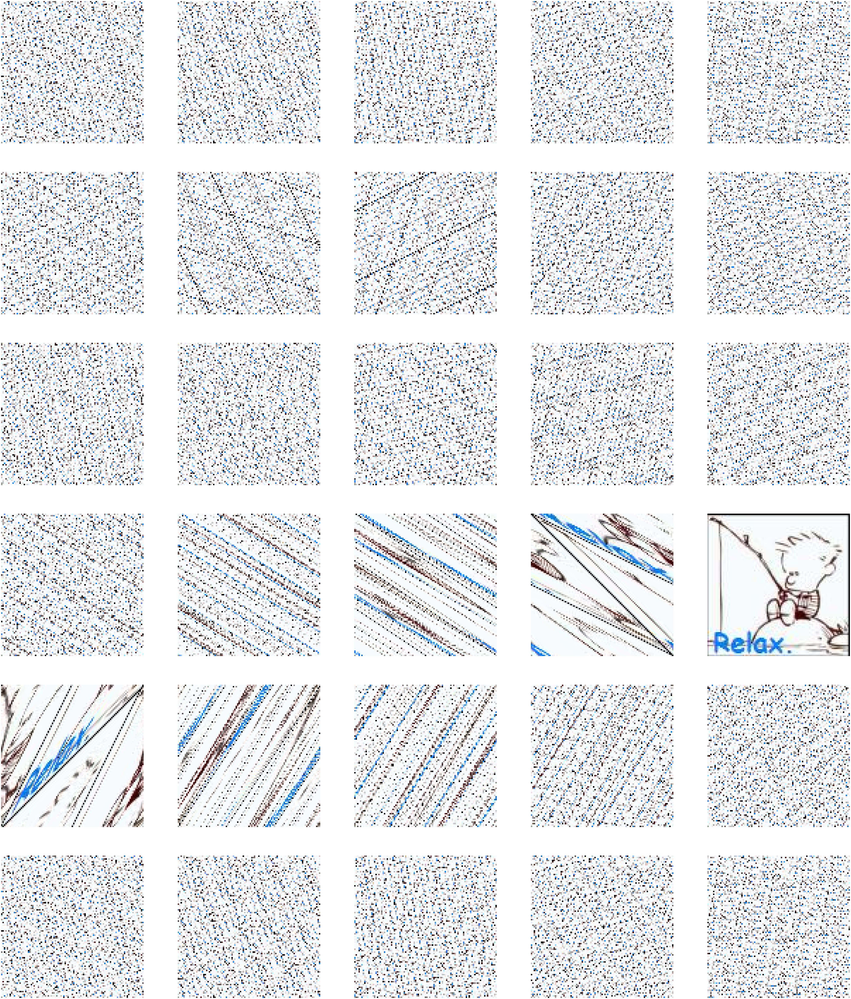

In [ ]:
arnold(imagem_3D, it=30)

#Matriz Chave Possíveis

In [ ]:
def eh_matriz_chave (matriz_teste):
  '''
  Funcao para verificar se a matriz pode ser usada como matriz chave
  - determinante da matriz igual a 1
  - autovalores com modulos diferentes de 1
  '''

  determinante = np.linalg.det(matriz_teste)
  autovalores, autovetores = np.linalg.eig(matriz_teste)

  if 1 in abs(autovalores):
    return False
  elif determinante == 1:
    return True
  else:
    return False


In [ ]:
def matrizes_chave_possiveis():
  matrizes_possiveis = []
  for a in range(100):
    for b in range(100):
      for c in range(100):
        for d in range(100):
          matriz = np.array([[a, b], [c, d]])
          if eh_matriz_chave(matriz):
            matrizes_possiveis.append(matriz)
  
  return matrizes_possiveis



In [ ]:
m_possiveis = matrizes_chave_possiveis()

KeyboardInterrupt: ignored

In [ ]:
m_possiveis_arr = np.array(m_possiveis)
m_possiveis_arr.shape

In [ ]:
#chaves possiveis para txt
m_possiveis_arr = np.array(m_possiveis)
m_possiveis_flat_arr = m_possiveis_arr.flatten()
np.savetxt('m_chaves_possiveis_0to100.txt', m_possiveis_flat_arr)

In [ ]:
#recuperando o txt
m_chave_flat = np.loadtxt('m_chaves_possiveis_0to50_301.txt')
m_possiveis_0to50 = m_chave_flat.reshape(301, 2, 2)

In [ ]:
m_possiveis_0to50[25]

array([[ 1.,  6.],
       [ 2., 13.]])

In [ ]:
int(35/6)

# a,b,c,d possiveis. Sem matriz

In [ ]:
possiveis_det = []
for a in range(101):
  for b in range(101):
    for c in range(101):
      for d in range(101):
        if (a*d - b*c) == 1:
          possiveis_det.append([[a, b], [c, d]])

In [ ]:
len(possiveis_det)

12175

In [ ]:
for i in range(10):
  print(possiveis_det[-i])

[[1, 0], [0, 1]]
[[100, 99], [1, 1]]
[[100, 97], [67, 65]]
[[100, 93], [43, 40]]
[[100, 91], [89, 81]]
[[100, 89], [91, 81]]
[[100, 87], [77, 67]]
[[100, 83], [53, 44]]
[[100, 81], [79, 64]]
[[100, 79], [81, 64]]


In [ ]:
possiveis_det_autovalores = []

for matriz in possiveis_det:
  if 1 not in abs(np.linalg.eig(matriz)[0]):
    possiveis_det_autovalores.append(matriz)

In [ ]:
len(possiveis_det_autovalores)

11974

In [ ]:
possiveis_det_autovalores[0]

[[1, 1], [1, 2]]

In [ ]:
for i in range(20):
  det = np.linalg.det(possiveis_det_autovalores[i])
  aut = np.linalg.eig(possiveis_det_autovalores[i])[0]
  print(eh_matriz_chave(possiveis_det_autovalores[i]), 'modulo autovalores', abs(aut), 'determinante: ',det)

NameError: ignored

# Tentando decodificar a Imagem do outro grupo

In [ ]:
red_them_path = 'b1.txt'
green_them_path = 'b2.txt'
blue_them_path = 'b3.txt'

red_them = np.loadtxt(red_them_path, delimiter=' ')
green_them = np.loadtxt(green_them_path, delimiter=' ')
blue_them = np.loadtxt(blue_them_path, delimiter=' ')

red_them_1D = red_them.flatten()
green_them_1D = green_them.flatten()
blue_them_1D = blue_them.flatten()

image_them_2D = np.array(list(zip(red_them_1D, green_them_1D, blue_them_1D)))
image_them_3D = image_them_2D.reshape(101, 101, 3)

In [ ]:
image_them_3D

array([[[1.        , 1.        , 1.        ],
        [0.01176471, 0.        , 0.        ],
        [0.04313725, 0.03529412, 0.03921569],
        ...,
        [0.6745098 , 0.00392157, 0.02745098],
        [0.83137255, 0.36078431, 0.29411765],
        [0.65882353, 0.65882353, 0.65098039]],

       [[1.        , 1.        , 1.        ],
        [0.94509804, 0.92941176, 0.9254902 ],
        [1.        , 1.        , 0.99215686],
        ...,
        [1.        , 0.95294118, 0.99215686],
        [0.98431373, 0.97647059, 0.98823529],
        [1.        , 0.98823529, 0.96470588]],

       [[1.        , 1.        , 1.        ],
        [0.70980392, 0.68627451, 0.68627451],
        [0.65098039, 0.67843137, 0.64705882],
        ...,
        [0.99215686, 0.99215686, 0.98431373],
        [1.        , 0.98823529, 0.98431373],
        [0.86666667, 0.97254902, 0.91372549]],

       ...,

       [[0.99215686, 0.96862745, 0.96862745],
        [1.        , 0.99607843, 0.99215686],
        [0.80784314, 0

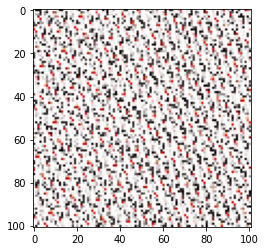

In [ ]:
plt.imshow(image_them_3D)

#### Menores somas a+b+c+d primeiro...

In [ ]:
possiveis_det_autovalores[0]

[[1, 1], [1, 2]]

In [ ]:
sum_abcd = []

for i in range(len(possiveis_det_autovalores)):
  sum_abcd.append([i, np.sum(possiveis_det_autovalores[i])])

In [ ]:
sorted_sum_abcd = sorted(sum_abcd, key=lambda x: x[1])

In [ ]:
for i in range(0, 68):
  print('Índice Ordenado: ', i, ' -> Índice NÃO ordenado: ', sorted_sum_abcd[i][0], ' -> Chave: ', 
        possiveis_det_autovalores[sorted_sum_abcd[i][0]], ' -> soma: ', sorted_sum_abcd[i][1])

Índice Ordenado:  0  -> Índice NÃO ordenado:  0  -> Chave:  [[1, 1], [1, 2]]  -> soma:  5
Índice Ordenado:  1  -> Índice NÃO ordenado:  473  -> Chave:  [[2, 1], [1, 1]]  -> soma:  5
Índice Ordenado:  2  -> Índice NÃO ordenado:  1  -> Chave:  [[1, 1], [2, 3]]  -> soma:  7
Índice Ordenado:  3  -> Índice NÃO ordenado:  99  -> Chave:  [[1, 2], [1, 3]]  -> soma:  7
Índice Ordenado:  4  -> Índice NÃO ordenado:  714  -> Chave:  [[3, 1], [2, 1]]  -> soma:  7
Índice Ordenado:  5  -> Índice NÃO ordenado:  747  -> Chave:  [[3, 2], [1, 1]]  -> soma:  7
Índice Ordenado:  6  -> Índice NÃO ordenado:  474  -> Chave:  [[2, 1], [3, 2]]  -> soma:  8
Índice Ordenado:  7  -> Índice NÃO ordenado:  523  -> Chave:  [[2, 3], [1, 2]]  -> soma:  8
Índice Ordenado:  8  -> Índice NÃO ordenado:  2  -> Chave:  [[1, 1], [3, 4]]  -> soma:  9
Índice Ordenado:  9  -> Índice NÃO ordenado:  148  -> Chave:  [[1, 3], [1, 4]]  -> soma:  9
Índice Ordenado:  10  -> Índice NÃO ordenado:  1012  -> Chave:  [[4, 1], [3, 1]]  -> so

### Testando

In [ ]:
arnold_abcd(image_them_3D, possiveis_det_autovalores[sorted_sum_abcd[67][0]])

In [ ]:
possiveis_det_autovalores[sorted_sum_abcd[67][0]]

[[8, 5], [3, 2]]

Análise

In [ ]:
print(possiveis_det_autovalores[sorted_sum_abcd[77][0]])
print(possiveis_det_autovalores[sorted_sum_abcd[132][0]])
print(possiveis_det_autovalores[sorted_sum_abcd[244][0]])
print(possiveis_det_autovalores[sorted_sum_abcd[314][0]])
print(possiveis_det_autovalores[sorted_sum_abcd[316][0]])
print(possiveis_det_autovalores[sorted_sum_abcd[330][0]])
print(possiveis_det_autovalores[sorted_sum_abcd[349][0]])

[[4, 11], [1, 3]]
[[6, 5], [7, 6]]
[[19, 2], [9, 1]]
[[17, 10], [5, 3]]
[[1, 4], [6, 25]]
[[1, 8], [3, 25]]
[[13, 17], [3, 4]]


### min <= a,b,c,d <= max

In [ ]:
def possiveis_det_autovalores_min_max(min, max, possiveis_det_autovalores):
  possiveis_det_aut_min_max = []
  for matriz in possiveis_det_autovalores:
    if matriz[0][0] >= min and matriz[0][0] <= max:
      if matriz[0][1] >= min and matriz[0][1] <= max:
        if matriz[1][0] >= min and matriz[1][0] <= max:
          if matriz[1][1] >= min and matriz[1][1] <= max:
            possiveis_det_aut_min_max.append(matriz)
            
  return possiveis_det_aut_min_max

In [ ]:
possiveis_det_autovalores_0_5 = possiveis_det_autovalores_min_max(0, 5, possiveis_det_autovalores)
possiveis_det_autovalores_0_20 = possiveis_det_autovalores_min_max(0, 20, possiveis_det_autovalores)

In [ ]:
len(possiveis_det_autovalores_0_20)

470

sort

In [ ]:
def sort_keys(Matr):
  sum_abcd = []

  for i in range(len(Matr)):
    sum_abcd.append([i, np.sum(Matr[i])])
  
  sorted_sum_abcd = sorted(sum_abcd, key=lambda x: x[1])

  return sorted_sum_abcd

In [ ]:
sorted_sum_abcd_0_20 = sort_keys(possiveis_det_autovalores_0_20)

In [ ]:
len(sorted_sum_abcd_0_20)

470

In [ ]:
for i in range(280, 310):
  print(i, ' -> ', sorted_sum_abcd_0_20[i][0], ' -> ', possiveis_det_autovalores_0_20[sorted_sum_abcd_0_20[i][0]], ' soma: ', sorted_sum_abcd_0_20[i][1])

280  ->  115  ->  [[3, 5], [10, 17]]  soma:  35
281  ->  123  ->  [[3, 10], [5, 17]]  soma:  35
282  ->  202  ->  [[6, 5], [13, 11]]  soma:  35
283  ->  209  ->  [[6, 13], [5, 11]]  soma:  35
284  ->  316  ->  [[11, 5], [13, 6]]  soma:  35
285  ->  328  ->  [[11, 13], [5, 6]]  soma:  35
286  ->  412  ->  [[17, 1], [16, 1]]  soma:  35
287  ->  416  ->  [[17, 5], [10, 3]]  soma:  35
288  ->  422  ->  [[17, 10], [5, 3]]  soma:  35
289  ->  429  ->  [[17, 16], [1, 1]]  soma:  35
290  ->  149  ->  [[4, 7], [9, 16]]  soma:  36
291  ->  151  ->  [[4, 9], [7, 16]]  soma:  36
292  ->  281  ->  [[9, 8], [10, 9]]  soma:  36
293  ->  283  ->  [[9, 10], [8, 9]]  soma:  36
294  ->  404  ->  [[16, 7], [9, 4]]  soma:  36
295  ->  405  ->  [[16, 9], [7, 4]]  soma:  36
296  ->  16  ->  [[1, 1], [17, 18]]  soma:  37
297  ->  57  ->  [[1, 17], [1, 18]]  soma:  37
298  ->  106  ->  [[3, 2], [19, 13]]  soma:  37
299  ->  118  ->  [[3, 7], [8, 19]]  soma:  37
300  ->  121  ->  [[3, 8], [7, 19]]  soma:  37
30

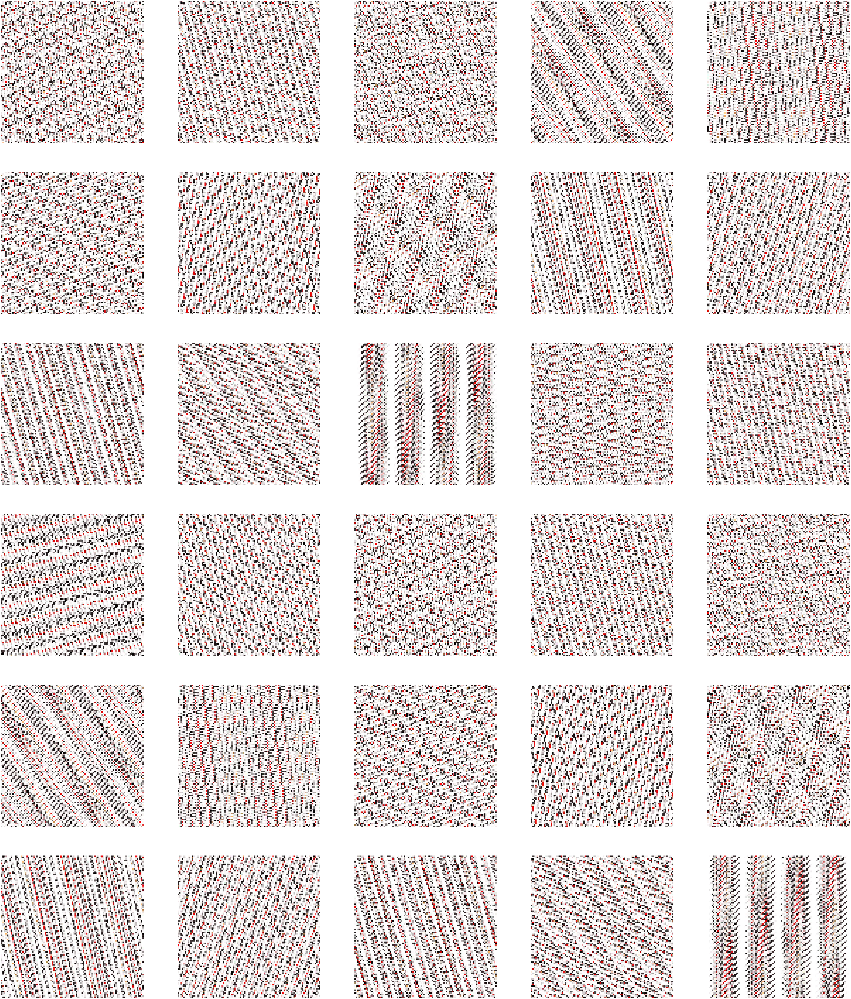

In [ ]:
arnold_abcd(image_them_3D, possiveis_det_autovalores_0_20[sorted_sum_abcd_0_20[310][0]])